In [111]:
import helpers
from skimage import io, filters, morphology, measure, segmentation, feature, restoration
import pandas as pd
file = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Desktop\\2024-09-04 165258\\improc\\signal\\001 - p4442 MAPK (Erk12) (137F5) Rabbit mAb #4695 Signal.tif"
properties = ('label', 'area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox',
                'centroid', 'centroid_local', 'centroid_weighted', 'centroid_weighted_local', 'coords_scaled', 'coords', 'eccentricity',
                'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled',
                'image_intensity', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean', 'intensity_min',
                'intensity_std', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted', 'moments_weighted_central',
                'moments_weighted_hu', 'moments_weighted_normalized', 'num_pixels', 'orientation', 'perimeter', 'perimeter_crofton',
                'slice', 'solidity')

signal = io.imread(file, plugin = 'pil')
signal = helpers.denoiseImage(signal)
membrane, memCoverage = helpers.find_membrane(signal)
corr_signal = helpers.baseline_corrected_img(signal, membrane, method = 1)
corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))
thresh_signal = corr_signal > filters.threshold_local(corr_signal)
labelled_signal, numRegs = measure.label(thresh_signal, return_num = True)
region_prop = pd.DataFrame(measure.regionprops_table(labelled_signal, intensity_image = corr_signal, properties = properties))


In [ ]:
from matplotlib import pyplot as plt
import numpy as np
plt.imshow(segmentation.mark_boundaries(thresh_signal, labelled_signal, color=(1,0,0)))
plt.show()
fil_region_prop_label = region_prop["label"][(region_prop["area"] > 2000) & (region_prop['intensity_mean'] > 1.6)]
#fil_region_prop_label = region_prop["label"][(region_prop['intensity_mean'] > 1.6)]
fil_labelled_signal = np.copy(labelled_signal)
fil_labelled_signal[~np.isin(fil_labelled_signal, fil_region_prop_label)] = 0
plt.imshow(segmentation.mark_boundaries(thresh_signal, fil_labelled_signal, color=(1,0,0), ))
plt.show()

In [ ]:
def store_evolution_in(lst):
    """Returns a callback function to store the evolution of the level sets in
    the given list.
    """

    def _store(x):
        lst.append(np.copy(x))

    return _store

init_ls = segmentation.checkerboard_level_set(corr_signal.shape, 6)
# List with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = segmentation.morphological_chan_vese(
    corr_signal, num_iter=35, init_level_set=init_ls, smoothing=3, iter_callback=callback
)

plt.imshow(corr_signal, cmap="gray")
plt.contour(ls, [0.5], colors='r')
plt.show()

In [ ]:
cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                     np.where(membrane)[1].min():np.where(membrane)[1].max()]

init_ls = segmentation.checkerboard_level_set(cropped_sig.shape, 6)
# List with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
ls = segmentation.morphological_chan_vese(
    cropped_sig, num_iter=35, init_level_set=init_ls, smoothing=3, iter_callback=callback
)

plt.imshow(cropped_sig, cmap="gray")
plt.contour(ls, [0.5], colors='r')

plt.show()

In [ ]:
from skimage import exposure
baground = restoration.rolling_ball(cropped_sig)
plt.imshow(exposure.equalize_hist(cropped_sig), cmap = 'gray')
plt.show()

In [ ]:
plt.imshow(exposure.equalize_hist(cropped_sig - baground), cmap = 'gray')

In [ ]:
baground_10 = restoration.rolling_ball(cropped_sig, radius=10)
plt.imshow(exposure.equalize_hist(cropped_sig - baground_10), cmap = 'gray')

In [ ]:
baground_10 = restoration.rolling_ball(cropped_sig, radius=250)
plt.imshow(exposure.equalize_hist(cropped_sig - baground_10), cmap = 'gray')

In [ ]:
import helpers
from skimage import io, filters, morphology, measure, segmentation, feature, restoration, exposure
import pandas as pd
from pybaselines import Baseline2D

file = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Desktop\\2024-09-04 165258\\improc\\signal\\001 - p4442 MAPK (Erk12) (137F5) Rabbit mAb #4695 Signal.tif"
properties = ('label', 'area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox',
                'centroid', 'centroid_local', 'centroid_weighted', 'centroid_weighted_local', 'coords_scaled', 'coords', 'eccentricity',
                'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled',
                'image_intensity', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean', 'intensity_min',
                'intensity_std', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted', 'moments_weighted_central',
                'moments_weighted_hu', 'moments_weighted_normalized', 'num_pixels', 'orientation', 'perimeter', 'perimeter_crofton',
                'slice', 'solidity')

signal = io.imread(file, plugin = 'pil')
membrane, memCoverage = helpers.find_membrane(signal)
cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                     np.where(membrane)[1].min():np.where(membrane)[1].max()]

# In this example the cropped sig returns odd number of rows, which results in extra row in the "pywt.waverec2" output
# check the number of columns and rows and if they are odd substract one
if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)

corr_signal = helpers.denoiseImage(cropped_sig)
corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))

x = np.arange(corr_signal.shape[0])
z = np.arange(corr_signal.shape[1])

baseline_fitter = Baseline2D(x, z, check_finite=False) 
baseline, params = baseline_fitter.arpls(corr_signal, lam=(1e6, 1e6 ) )

plt.imshow(exposure.equalize_adapthist(corr_signal), cmap = 'gray')
plt.show()
plt.imshow(exposure.equalize_adapthist(baseline), cmap = 'gray')
plt.show()
che_img = corr_signal - baseline
che_img[che_img > corr_signal.max()] = 0
plt.imshow(exposure.equalize_adapthist(che_img), cmap = 'gray')
plt.show()

# corr_signal = helpers.baseline_correcte_img(signal, membrane, method = 1)
# corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))
# thresh_signal = corr_signal > filters.threshold_lcal(corr_signal)
# labelled_signal, numRegs = measure.label(thresh_signal, return_num = True)
# region_prop = pd.DataFrame(measure.regionprops_table(labelled_signal, intensity_image = corr_signal, properties = properties))

In [ ]:
helpers.showImgProfile(baseline, yLine=1200, eqHist=2)
helpers.showImgProfile(corr_signal, yLine=1200, eqHist=2)
helpers.showImgProfile(che_img, yLine = 1200, eqHist=2)
helpers.showImgProfile(che_img, yLine = 1200, eqHist=1)
helpers.showImgProfile(che_img, yLine = 1200, eqHist=0)
helpers.showImgProfile(signal, yLine=1450, eqHist=2)

In [ ]:
import os
import helpers
from skimage import io, filters, morphology, measure, segmentation, feature, restoration, exposure
import pandas as pd
from pybaselines import Baseline2D
import numpy as np
from matplotlib import pyplot as plt

properties = ('label', 'area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox',
                'centroid', 'centroid_local', 'centroid_weighted', 'centroid_weighted_local', 'coords_scaled', 'coords', 'eccentricity',
                'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled',
                'image_intensity', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean', 'intensity_min',
                'intensity_std', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted', 'moments_weighted_central',
                'moments_weighted_hu', 'moments_weighted_normalized', 'num_pixels', 'orientation', 'perimeter', 'perimeter_crofton',
                'slice', 'solidity')

dirname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal"

for file in os.listdir(dirname):
    if os.path.splitext(file)[1]==".tif":
        signal = io.imread(os.path.join(dirname, file), plugin = 'pil')
        membrane, memCoverage = helpers.find_membrane(signal)
        cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                             np.where(membrane)[1].min():np.where(membrane)[1].max()]
        
        if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
        if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)
        
        corr_signal = helpers.denoiseImage(cropped_sig)
        corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))
        
        x = np.arange(corr_signal.shape[0])
        z = np.arange(corr_signal.shape[1])
        
        baseline_fitter = Baseline2D(x, z, check_finite=False) 
        baseline, params = baseline_fitter.arpls(corr_signal, lam=(1e6, 1e6 ) )
        
        # plt.imshow(exposure.equalize_adapthist(corr_signal), cmap = 'gray')
        # plt.show()
        # plt.imshow(exposure.equalize_adapthist(baseline), cmap = 'gray')
        # plt.show()
        che_img = corr_signal - baseline
        che_img[che_img > corr_signal.max()] = 0
        # plt.imshow(exposure.equalize_adapthist(che_img), cmap = 'gray')
        # plt.show()
        helpers.showImgProfile(signal, yLine=1450, eqHist=2)
        plt.show()
        helpers.showImgProfile(corr_signal, yLine=1200, eqHist=2)
        plt.show()
        helpers.showImgProfile(baseline, yLine=1200, eqHist=2)
        plt.show()
        helpers.showImgProfile(che_img, yLine = 1200, eqHist=2)
        plt.show()
        
    else: continue

In [ ]:
helpers.showImgHist(che_img, eqHist=0)

In [ ]:
thresh_signal = che_img > filters.threshold_local(che_img)
thresh_signal = filters.median(thresh_signal, footprint=morphology.disk(10))
helpers.showImgProfile(thresh_signal, yLine=1600, lw=100)

In [ ]:
import os
import helpers
from skimage import io, filters, morphology, measure, segmentation, feature, restoration, exposure
import pandas as pd
from pybaselines import Baseline2D
import numpy as np
from matplotlib import pyplot as plt

properties = ('label', 'area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox',
                'centroid', 'centroid_local', 'centroid_weighted', 'centroid_weighted_local', 'coords_scaled', 'coords', 'eccentricity',
                'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled',
                'image_intensity', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean', 'intensity_min',
                'intensity_std', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted', 'moments_weighted_central',
                'moments_weighted_hu', 'moments_weighted_normalized', 'num_pixels', 'orientation', 'perimeter', 'perimeter_crofton',
                'slice', 'solidity')

file = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\006 - 4970 Signal.tif"

signal = io.imread(file, plugin = 'pil')
membrane, memCoverage = helpers.find_membrane(signal)
cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                             np.where(membrane)[1].min():np.where(membrane)[1].max()]
        
if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)
        
corr_signal = helpers.denoiseImage(cropped_sig)
corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))
        
x = np.arange(corr_signal.shape[0])
z = np.arange(corr_signal.shape[1])

baseline_fitter = Baseline2D(x, z, check_finite=False) 
baseline, params = baseline_fitter.arpls(corr_signal, lam=(1e6, 1e6 ) )

# plt.imshow(exposure.equalize_adapthist(corr_signal), cmap = 'gray')
# plt.show()
# plt.imshow(exposure.equalize_adapthist(baseline), cmap = 'gray')
# plt.show()
che_img = corr_signal - baseline
che_img[che_img > corr_signal.max()] = 0
# plt.imshow(exposure.equalize_adapthist(che_img), cmap = 'gray')
# plt.show()
helpers.showImgProfile(signal, yLine=1450, eqHist=2)
plt.show()
helpers.showImgProfile(corr_signal, yLine=1200, eqHist=2)
plt.show()
helpers.showImgProfile(baseline, yLine=1200, eqHist=2)
plt.show()
helpers.showImgProfile(che_img, yLine = 1200, eqHist=2)
plt.show()

In [ ]:
peaks = feature.peak_local_max(corr_signal, threshold_rel=0.4)
peaks_img = np.zeros_like(corr_signal)
plt.imshow(corr_signal, cmap = 'gray')
plt.plot(peaks[:,1], peaks[:,0], 'r.')
from skimage import util
inv_corr_signal = util.invert(corr_signal)
peaks2 = feature.peak_local_max(inv_corr_signal, threshold_rel=0.9999999)
# plt.imshow(inv_corr_signal, cmap = 'gray')
plt.plot(peaks2[:,1], peaks2[:,0], 'g.')


In [ ]:
s = feature.shape_index(signal)
#s = filters.gaussian(s, sigma=1)
point_y, point_x = np.where(abs(s) > 0.99)
plt.imshow(s, cmap='gray')
plt.scatter(point_x, point_y, color='blue', s=1)
plt.show()
helpers.showImgHist(s, eqHist=0)
helpers.showImgProfile(s, eqHist=0, yLine = 1625)

In [ ]:
import os
import helpers
from skimage import io, filters, morphology, measure, segmentation, feature, restoration, exposure
import pandas as pd
from pybaselines import Baseline2D
import numpy as np
from matplotlib import pyplot as plt

properties = ('label', 'area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox',
                'centroid', 'centroid_local', 'centroid_weighted', 'centroid_weighted_local', 'coords_scaled', 'coords', 'eccentricity',
                'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled',
                'image_intensity', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean', 'intensity_min',
                'intensity_std', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted', 'moments_weighted_central',
                'moments_weighted_hu', 'moments_weighted_normalized', 'num_pixels', 'orientation', 'perimeter', 'perimeter_crofton',
                'slice', 'solidity')

file = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\006 - 4970 Signal.tif"

signal = io.imread(file, plugin = 'pil')
membrane, memCoverage = helpers.find_membrane(signal)
cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                             np.where(membrane)[1].min():np.where(membrane)[1].max()]
        
if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)
        
corr_signal = helpers.denoiseImage(cropped_sig)
corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))

edge_sobel = filters.sobel(corr_signal)
point_y, point_x = np.where((edge_sobel > 0.05*edge_sobel.max()))
helpers.showImgHist(edge_sobel)
plt.show()
plt.imshow(edge_sobel, cmap='gray')
plt.scatter(point_x, point_y, color='blue', s=1)
plt.show()
helpers.showImgProfile(edge_sobel, yLine=1475)

In [ ]:
import os
import helpers
from skimage import io, filters, morphology, measure, segmentation, feature, restoration, exposure
import pandas as pd
from pybaselines import Baseline2D
import numpy as np
from matplotlib import pyplot as plt

properties = ('label', 'area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox',
                'centroid', 'centroid_local', 'centroid_weighted', 'centroid_weighted_local', 'coords_scaled', 'coords', 'eccentricity',
                'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'image', 'image_convex', 'image_filled',
                'image_intensity', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean', 'intensity_min',
                'intensity_std', 'moments', 'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted', 'moments_weighted_central',
                'moments_weighted_hu', 'moments_weighted_normalized', 'num_pixels', 'orientation', 'perimeter', 'perimeter_crofton',
                'slice', 'solidity')

file = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\006 - 4970 Signal.tif"

signal = io.imread(file, plugin = 'pil')
membrane, memCoverage = helpers.find_membrane(signal)
cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                             np.where(membrane)[1].min():np.where(membrane)[1].max()]
        
if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)
        
corr_signal = helpers.denoiseImage(cropped_sig)
corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))

edge_scharr = filters.scharr(corr_signal)
point_y, point_x = np.where((edge_scharr > 0.05*edge_scharr.max()))
helpers.showImgHist(edge_scharr)
plt.show()
plt.imshow(edge_scharr, cmap='gray')
plt.scatter(point_x, point_y, color='blue', s=1)
plt.show()
helpers.showImgProfile(edge_scharr, yLine=1475)


In [ ]:
from scipy.ndimage import median_filter


def fill_missing_with_median(image):
    filled_image = image.copy()
    nan_mask = np.isnan(filled_image)  # Mask for missing pixels
    
    while np.any(nan_mask):
        median_filled = filters.median(np.nan_to_num(filled_image, nan=np.nanmedian(filled_image)), footprint=morphology.disk(3))
        filled_image[nan_mask] = median_filled[nan_mask]
        nan_mask = np.isnan(filled_image)

    return filled_image

def filter_bubbles(image):
    while np.count_nonzero(image==0) >1000:
        edge_scharr = filters.scharr(image)
        edge_scharr_bw = edge_scharr > 0.05 * edge_scharr.max()
        image_copy = np.copy(image.astype(float))
        image_copy[edge_scharr_bw] = np.nan
        image_filled = fill_missing_with_median(image_copy)
        image = np.copy(image_filled.astype(np.uint16))
    return image

# edge_scharr = filters.scharr(corr_signal)
# edge_scharr_bw = edge_scharr > 0.05*edge_scharr.max()
# corr_signal_copy = np.copy(corr_signal.astype(float))
# corr_signal_copy[edge_scharr_bw] = np.nan
# corr_signal_filled = fill_missing_with_median(corr_signal_copy)
corr_signal_filled = filter_bubbles(corr_signal)

helpers.showImgProfile(corr_signal, yLine=1250)
plt.show()
helpers.showImgProfile(corr_signal_filled, yLine=1250)
plt.show()

x = np.arange(corr_signal_filled.shape[0])
z = np.arange(corr_signal_filled.shape[1])

baseline_fitter = Baseline2D(x, z, check_finite=False) 
baseline, params = baseline_fitter.arpls(corr_signal_filled, lam=(1e6, 1e6 ) )

# plt.imshow(exposure.equalize_adapthist(corr_signal_filled), cmap = 'gray')
# plt.show()
# plt.imshow(exposure.equalize_adapthist(baseline), cmap = 'gray')
# plt.show()
che_img = corr_signal - baseline
che_img[che_img > corr_signal.max()] = 0

In [ ]:
helpers.showImgProfile(corr_signal, yLine=1500, eqHist=2, lw =50)
plt.show()
helpers.showImgProfile(baseline, yLine=1500, eqHist=2, lw =50)
plt.show()
helpers.showImgProfile(che_img, yLine = 1500, eqHist=2, lw =50)
plt.show()

In [ ]:
import helpers
from skimage import draw
peaks = feature.corner_peaks(che_img, indices=True, min_distance=100, num_peaks=80)
che_mask = np.zeros(che_img.shape, dtype=np.bool_)
row_offset = 75
col_offset = 75

for i in range(len(peaks)):
    peak_img = che_img[int(peaks[i][0]-row_offset):int(peaks[i][0]+row_offset) , int(peaks[i][1]-col_offset):int(peaks[i][1]+col_offset)]
    peak_mask = np.zeros(peak_img.shape, dtype=np.bool_)
    contours = measure.find_contours(peak_img, 20*np.median(che_img))
    for contour in contours:
        rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
        peak_mask[rows, cols] = True
    #peak_mask = morphology.binary_dilation(peak_mask, footprint=morphology.disk(2))
    che_mask[int(peaks[i][0]-row_offset):int(peaks[i][0]+row_offset) , int(peaks[i][1]-col_offset):int(peaks[i][1]+col_offset)] = peak_mask

helpers.showRoiBoundary(che_img, che_mask, eqHist=1, file_=file)
plt.show()


In [ ]:
import helpers
from skimage import draw
peaks = feature.corner_peaks(che_img, indices=True, min_distance=100, num_peaks=80)
che_mask = np.zeros(che_img.shape, dtype=np.bool_)
row_offset = 800
col_offset = 800

def generate_peak_mask(che_img, peak_indices, lvl = 20*np.median(che_img), row_offset = 75, col_offset = 75):
    che_mask = np.zeros(che_img.shape, dtype=np.bool_)
    for i in range(len(peak_indices)):
        peak_img = che_img[peaks[i][0] - row_offset : peaks[i][0] + row_offset ,
                           peaks[i][1] - col_offset : peaks[i][1] + col_offset]
        peak_mask = np.zeros(peak_img.shape, dtype = np.bool_)
        contours = measure.find_contours(peak_img, lvl)
        for contour in contours:
            if (contour[0] == contour[-1]).all():
                rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
                peak_mask[rows, cols] = True
        che_mask[peaks[i][0]-row_offset:peaks[i][0]+row_offset , peaks[i][1]-col_offset:peaks[i][1]+col_offset] = peak_mask
        

i=1
#for i in range(len(peaks)):
peak_img = che_img[int(peaks[i][0]-row_offset):int(peaks[i][0]+row_offset) , int(peaks[i][1]-col_offset):int(peaks[i][1]+col_offset)]
peak_mask = np.zeros(peak_img.shape, dtype=np.bool_)
contours = measure.find_contours(peak_img, 20*np.median(che_img))
plt.imshow(peak_img, cmap='gray')
for contour in contours:
    # contour = contours[4]
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)    
    rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
    peak_mask[rows, cols] = True
# peak_mask = morphology.binary_dilation(peak_mask, footprint=morphology.disk(2))
#che_mask[int(peaks[i][0]-row_offset):int(peaks[i][0]+row_offset) , int(peaks[i][1]-col_offset):int(peaks[i][1]+col_offset)] = peak_mask
plt.show()
helpers.showRoiBoundary(peak_img, peak_mask, eqHist=1, file_=file)
plt.show()
# plt.imshow(peak_mask,cmap='gray')
peak_mask = np.zeros(peak_img.shape, dtype=np.bool_)
plt.imshow(peak_img, cmap='gray')
for contour in contours:
    # contour = contours[4]
    if (contour[0] == contour[-1]).all():
        plt.plot(contour[:, 1], contour[:, 0], linewidth=2)    
        rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
        if np.percentile(peak_img[rows, cols], 75) > 20*np.median(che_img):
            peak_mask[rows, cols] = True
        else:
            peak_mask[rows, cols] = False
# peak_mask = morphology.binary_dilation(peak_mask, footprint=morphology.disk(2))
#che_mask[int(peaks[i][0]-row_offset):int(peaks[i][0]+row_offset) , int(peaks[i][1]-col_offset):int(peaks[i][1]+col_offset)] = peak_mask
plt.show()
helpers.showRoiBoundary(peak_img, peak_mask, eqHist=1, file_=file)
plt.show()

In [ ]:
# Numbers to check
row_t = 800
row_b = 800
col_l = 800
col_r = 800
roi_coor = np.array([row_t, row_b, col_l, col_r])
check = np.array([contour[0][0], contour[-1][0], contour[0][1], contour[-1][1]])
print(check)
if 0 in (check[:1]):
    print("add rows to the row_t")
    row_t = row_t + 25
if (np.sum(roi_coor[:2]) - 1) in check[:1]:
    print("add rows to the row_b")
    row_b = row_b + 25
if 0 in (check[2:]):
    print("add cols to the left")
    col_l = col_l + 25
if (np.sum(roi_coor[2:]) - 1) in check[2:]:
    print("add cols to the right")
    col_r = col_r + 25
check[:2]
np.sum(roi_coor[:2]) - 1
(np.sum(roi_coor[2:]) - 1)

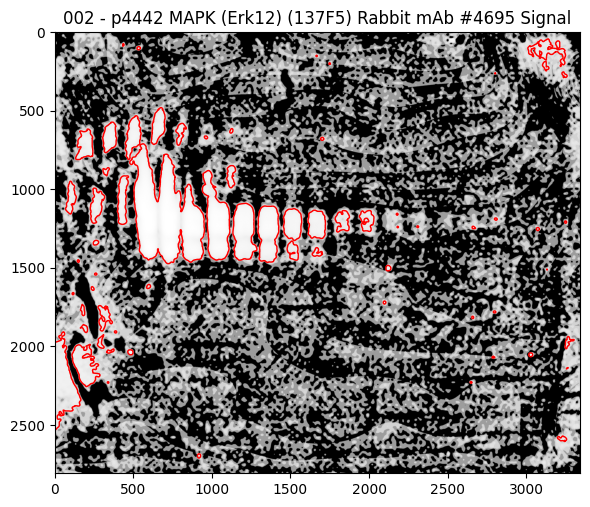

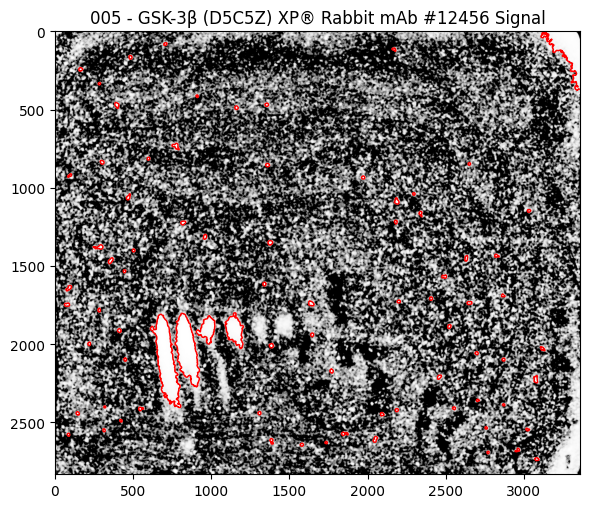

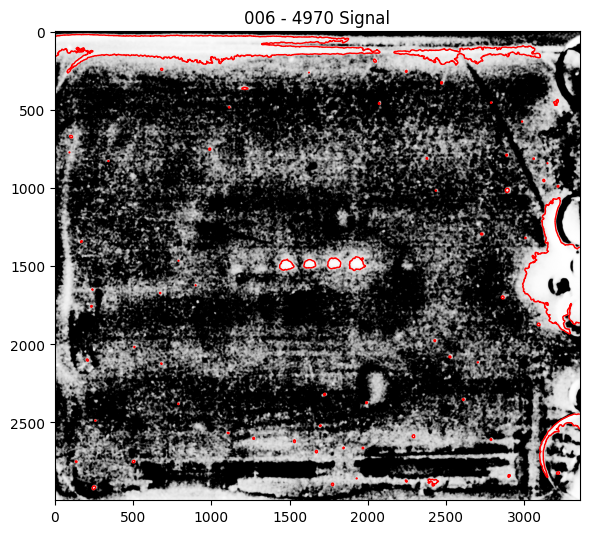

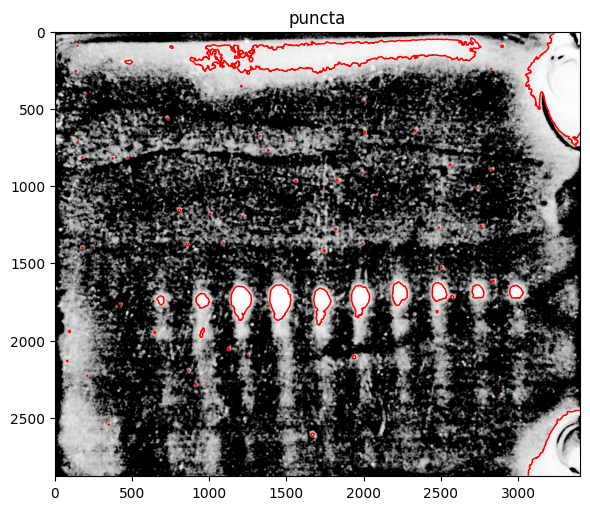

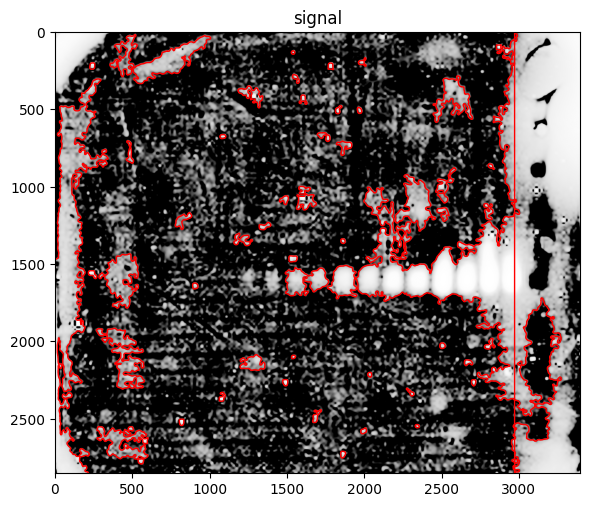

In [1]:
# evaulate peaks
# for each peak 
#   take a subset of image with specified size
#   find contours in the image
#       for each contour
#           check if contour is closed
#               draw the mask
#           check which boundary contour intersects
#               increase that side
#               go back to line 3
import process_images, helpers, os
from skimage import feature
from matplotlib import pyplot as plt

#fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\006 - 4970 Signal.tif"
dirname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal"

for fname in os.listdir(dirname):
    if os.path.splitext(fname)[1]==".tif":
        fun_img = process_images.process_images(os.path.join(dirname, fname))
        fun_mask = process_images.generate_peak_mask(fun_img, min_dist=80)
        helpers.showRoiBoundary(fun_img, fun_mask, file_=os.path.join(dirname, fname))
        plt.show()

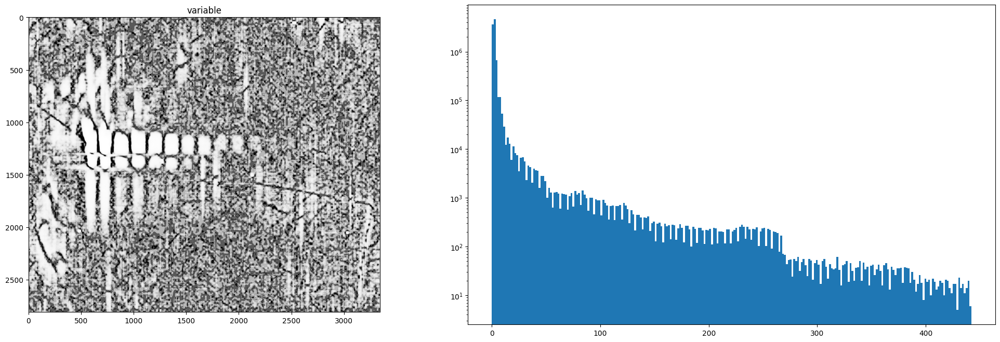

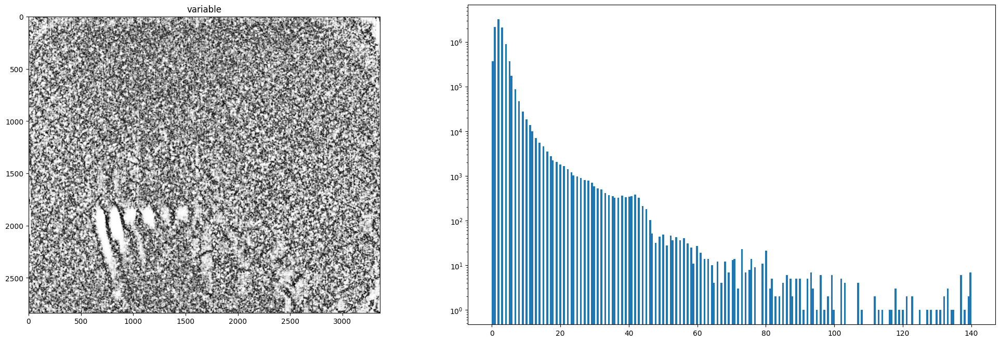

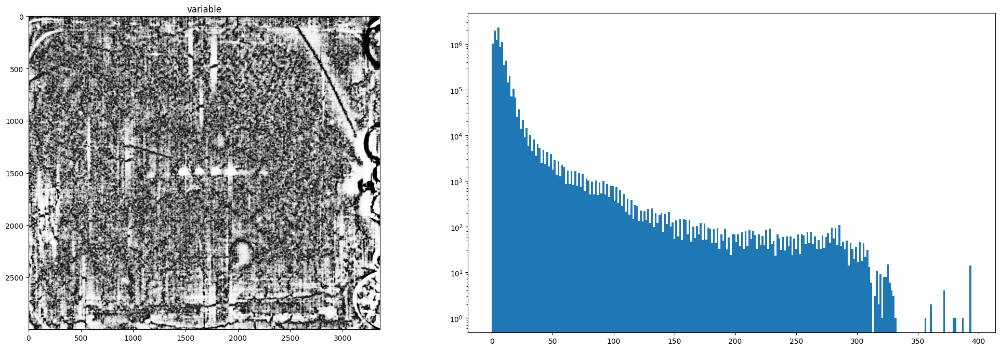

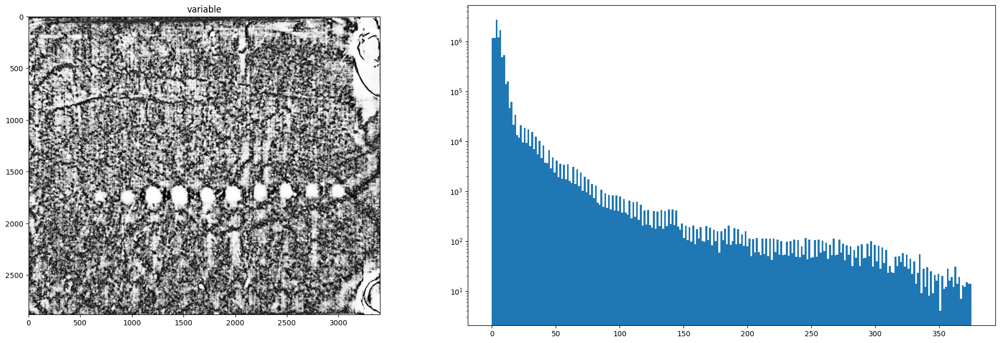

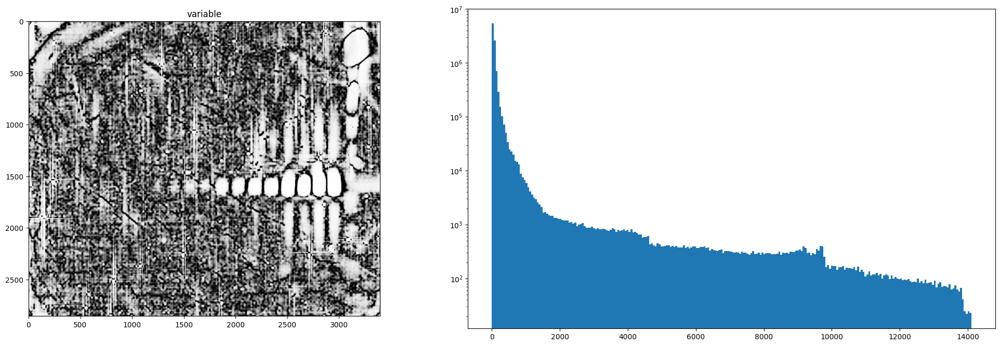

In [105]:
import process_images, helpers, os
from skimage import feature, io, filters, morphology
from matplotlib import pyplot as plt
from pybaselines import Baseline2D

dirname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal"

for fname in os.listdir(dirname):
    if os.path.splitext(fname)[1]==".tif":
        file = os.path.join(dirname, fname)
        signal = io.imread(file, plugin = 'pil')
        membrane, memCoverage = helpers.find_membrane(signal)
        cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                                np.where(membrane)[1].min():np.where(membrane)[1].max()]
        
        if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
        if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)
        
        corr_signal = helpers.denoiseImage(cropped_sig)
        corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))

        corr_signal_filled = process_images.filter_bubbles(corr_signal)

        x = np.arange(corr_signal_filled.shape[0])
        z = np.arange(corr_signal_filled.shape[1])
        
        baseline_fitter = Baseline2D(x, z, check_finite=False) 
        # baseline, _ = baseline_fitter.individual_axes(corr_signal_filled, method='iasls', method_kwargs=({'lam':1e4}))
        baseline, _ = baseline_fitter.individual_axes(corr_signal_filled, method='iasls', axes=(1,0),
                                                      method_kwargs=({'lam':1e6, 'lam_1': 1e-4, 'p': 0.05}))

        corrected_sig = corr_signal - baseline
        corrected_sig[corrected_sig > corr_signal.max()] = 0
        # fun_img = process_images.process_images(os.path.join(dirname, fname))
        # fun_mask = process_images.generate_peak_mask(fun_img, min_dist=80)
        helpers.showImgHist(corrected_sig)
        plt.show()

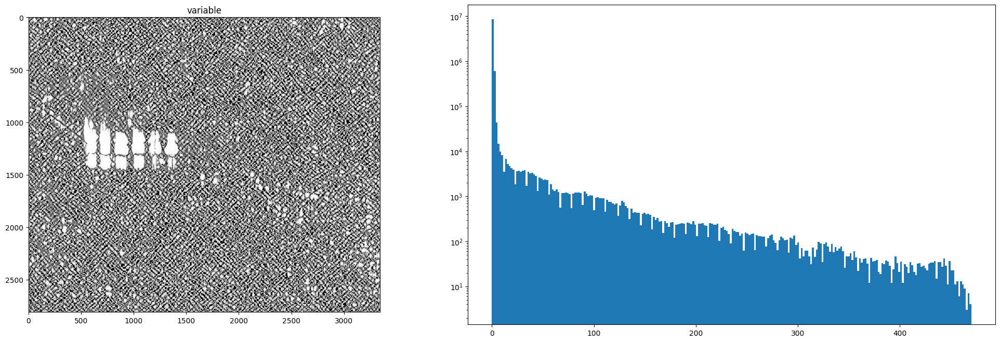

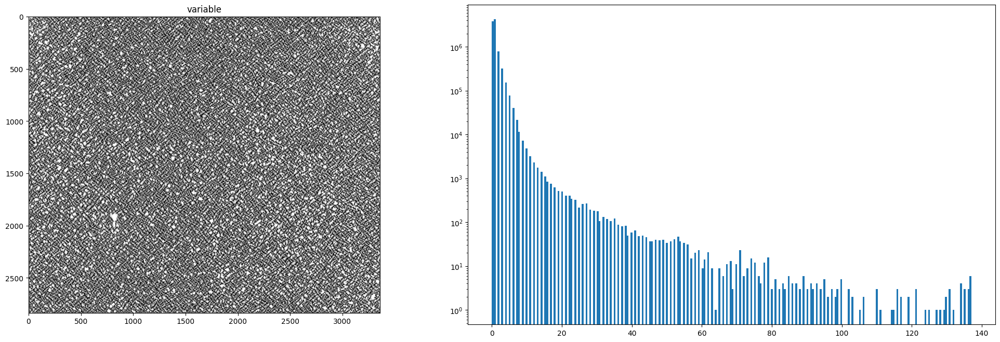

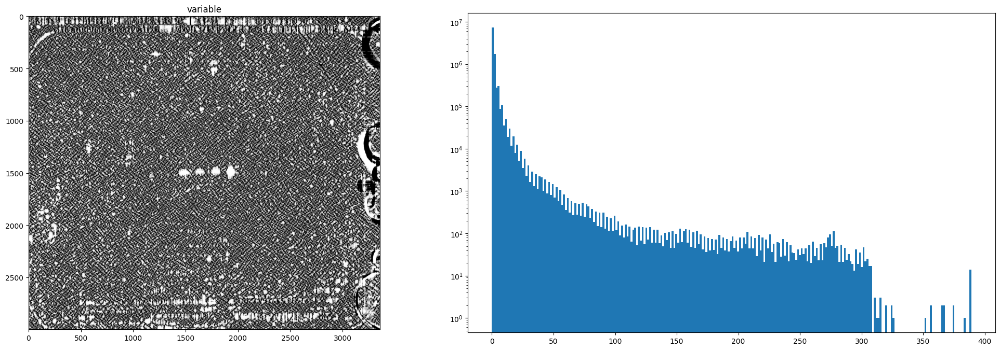

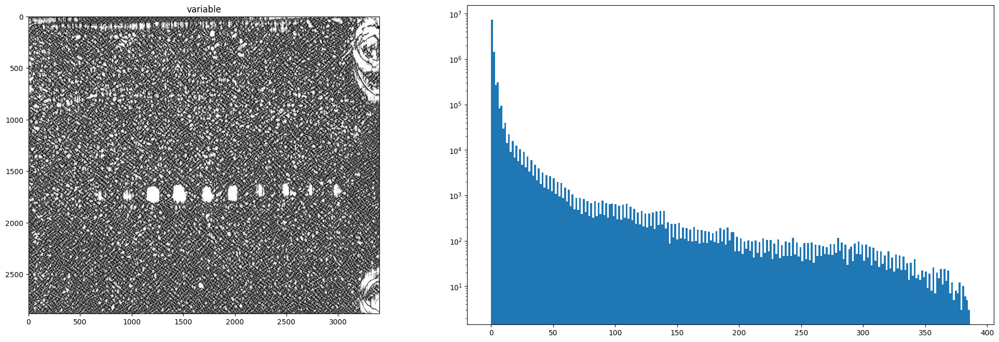

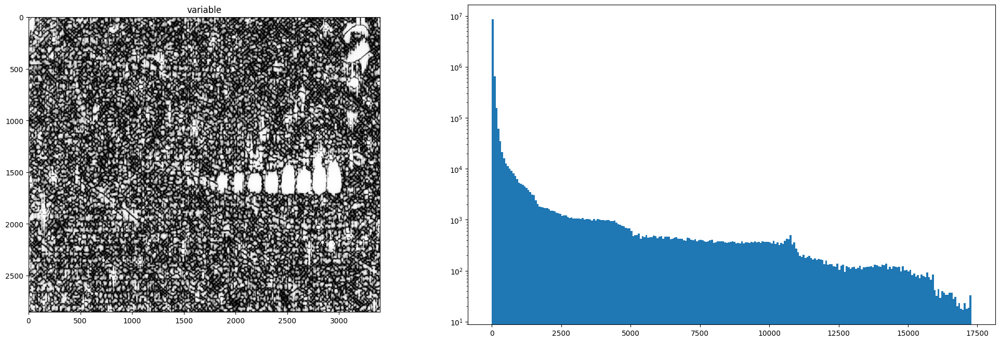

In [114]:
import process_images, helpers, os
from skimage import feature, io, filters, morphology
from matplotlib import pyplot as plt
from pybaselines import Baseline2D

dirname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal"

for fname in os.listdir(dirname):
    if os.path.splitext(fname)[1]==".tif":
        file = os.path.join(dirname, fname)
        signal = io.imread(file, plugin = 'pil')
        membrane, memCoverage = helpers.find_membrane(signal)
        cropped_sig = signal[np.where(membrane)[0].min():np.where(membrane)[0].max(), 
                                np.where(membrane)[1].min():np.where(membrane)[1].max()]
        
        if cropped_sig.shape[0] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[0] - 1, axis=0)
        if cropped_sig.shape[1] % 2 == 1: cropped_sig = np.delete(cropped_sig, cropped_sig.shape[1] - 1, axis=1)
        
        corr_signal = helpers.denoiseImage(cropped_sig)
        corr_signal = filters.median(corr_signal, footprint = morphology.disk(7))

        corr_signal_filled = process_images.filter_bubbles(corr_signal)

        x = np.arange(corr_signal_filled.shape[0])
        z = np.arange(corr_signal_filled.shape[1])
        
        baseline_fitter = Baseline2D(x, z, check_finite=False) 
        baseline, _ = baseline_fitter.individual_axes(corr_signal_filled, method='arpls', 
                                                      method_kwargs=({'lam':1e4}))
        
        corrected_sig = corr_signal - baseline
        corrected_sig[corrected_sig > corr_signal.max()] = 0
        # fun_img = process_images.process_images(os.path.join(dirname, fname))
        # fun_mask = process_images.generate_peak_mask(fun_img, min_dist=80)
        helpers.showImgHist(corrected_sig)
        plt.show()

In [6]:
import process_images
import numpy as np
import os
import helpers
from skimage import feature, measure
from matplotlib import pyplot as plt
fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\signal.tif"
# fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\002 - p4442 MAPK (Erk12) (137F5) Rabbit mAb #4695 Signal.tif"
# dirname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal"

fun_img = process_images.process_images(fname)
# peaks = feature.corner_peaks(fun_img, indices=True, min_distance=100, num_peaks=80)
# level = 5*np.median(fun_img)
# contours = measure.find_contours(fun_img, level)
# len(contours)
# fun_mask = process_images.generate_peak_mask(fun_img)
# helpers.showRoiBoundary(fun_img, fun_mask)
# plt.show()

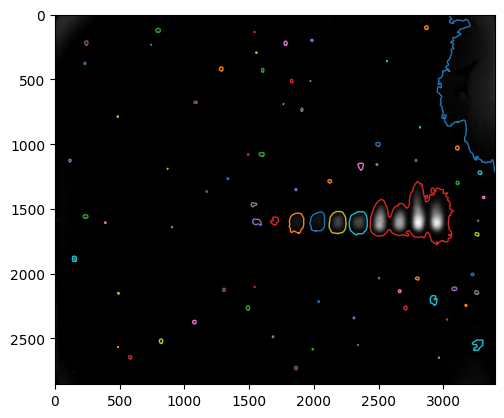

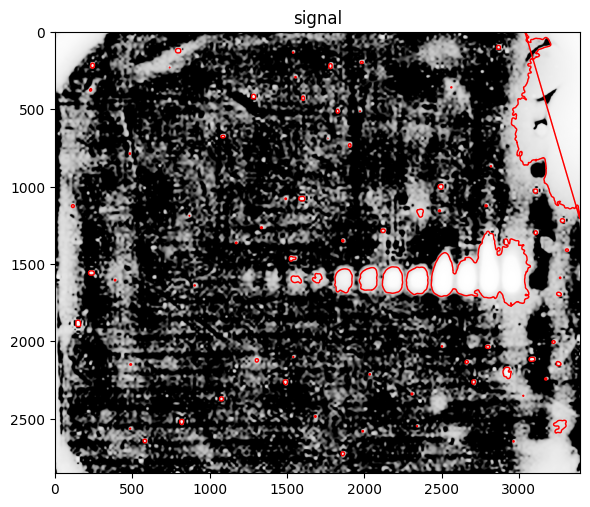

In [95]:
# Shows the problem with "draw polygon" when contour is not closed
import process_images
import numpy as np
import os
import helpers
from skimage import feature, measure, draw
from matplotlib import pyplot as plt
fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\signal.tif"

fun_img = process_images.process_images(fname)

peaks = feature.corner_peaks(fun_img, indices=True, min_distance=80, num_peaks=80)
level = 80
contours = measure.find_contours(fun_img, level)
found_contours = []
# max_iteration = 0
while len(found_contours) < len(peaks): # - 5 and max_iteration < 30:
    prev_contours = found_contours
    found_contours = []
    contours = measure.find_contours(fun_img, level)
    for contour in contours:
        if measure.points_in_poly(peaks, contour).any() == True:
            found_contours.append(contour)
    if len(found_contours) < len(prev_contours):
        found_contours = prev_contours
        break
    level += 1
    # max_iteration += 1

plt.imshow(fun_img, cmap='gray')
for contour in found_contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=1)
plt.show()

fun_mask = np.zeros(fun_img.shape, dtype=np.bool_)
for contour in found_contours:
    rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
    fun_mask[rows, cols] = True

helpers.showRoiBoundary(fun_img, fun_mask, file_= fname)
plt.show()

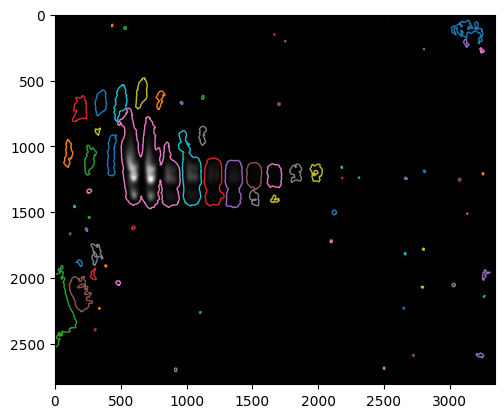

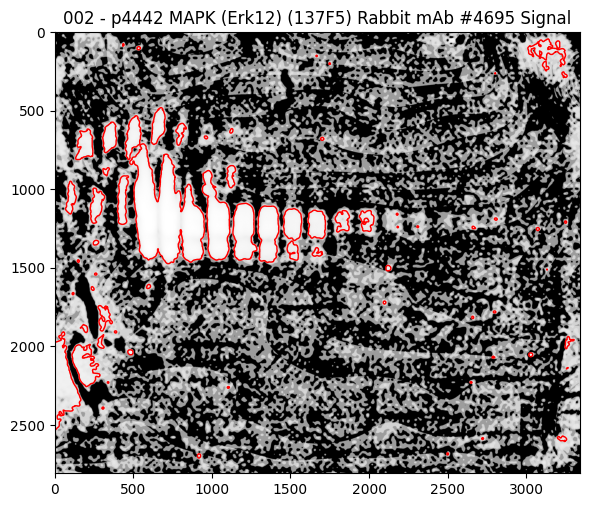

In [92]:
# Good script to test band finding
from skimage import draw
#for contour in contours:
#point = np.array([[peaks[0][0], peaks[0][1]]])
fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\002 - p4442 MAPK (Erk12) (137F5) Rabbit mAb #4695 Signal.tif"

fun_img = process_images.process_images(fname)

peaks = feature.corner_peaks(fun_img, indices=True, min_distance=80, num_peaks=80)
level = np.median(fun_img)
contours = measure.find_contours(fun_img, level)
found_contours = []
# max_iteration = 0
while len(found_contours) < len(peaks): # - 5 and max_iteration < 30:
    prev_contours = found_contours.copy()
    found_contours = []
    contours = measure.find_contours(fun_img, level)
    for contour in contours:
        if measure.points_in_poly(peaks, contour).any() == True:
            found_contours.append(contour)
    if len(found_contours) < len(prev_contours):
        found_contours = prev_contours.copy()
        break
    level += 1
    # max_iteration += 1

plt.imshow(fun_img, cmap='gray')
for contour in found_contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=1)
plt.show()

fun_mask = np.zeros(fun_img.shape, dtype=np.bool_)
for contour in found_contours:
    rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
    fun_mask[rows, cols] = True

helpers.showRoiBoundary(fun_img, fun_mask, file_= fname)
plt.show()

In [94]:
# Given "Peaks" and "found contours", it returns the peaks that are not in any of the "found contours"
from skimage import measure
#found_peaks = 
# i=0
missing_peaks = peaks.copy()
for contour in contours:
    # measure.points_in_poly(missing_peaks, contour) == True
    found_peaks = missing_peaks[np.where(measure.points_in_poly(missing_peaks, contour) == True)]
    for peak in found_peaks:
        matching_index = np.where((missing_peaks == peak).all(axis=1))[0]
        missing_peaks = np.delete(missing_peaks, matching_index, axis=0)

In [19]:
fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\puncta.tif"

fun_img = process_images.process_images(fname)

In [23]:
# Given "corrected_sig" image, this returns the list of peaks and found contours
from skimage import measure
peaks = feature.peak_local_max(fun_img, min_distance=80, num_peaks=80)
level = np.median(fun_img)
contours = measure.find_contours(fun_img, level)
found_contours = []
# max_iteration = 0
while len(found_contours) < len(peaks): # - 5 and max_iteration < 30:
    prev_contours = found_contours
    found_contours = []
    contours = measure.find_contours(fun_img, level)
    for contour in contours:
        if measure.points_in_poly(peaks, contour).any() == True:
            found_contours.append(contour)
    if len(found_contours) < len(prev_contours):
        found_contours = prev_contours
        break
    level += 1

[0, 3401]
[2879, 3401]


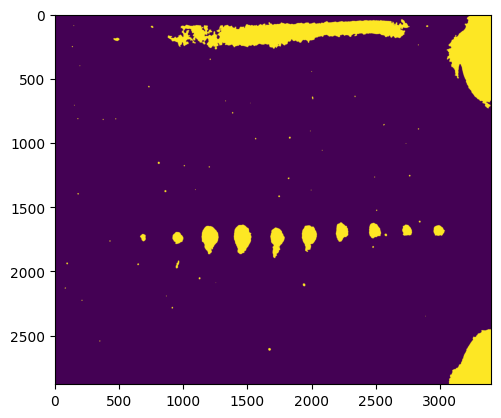

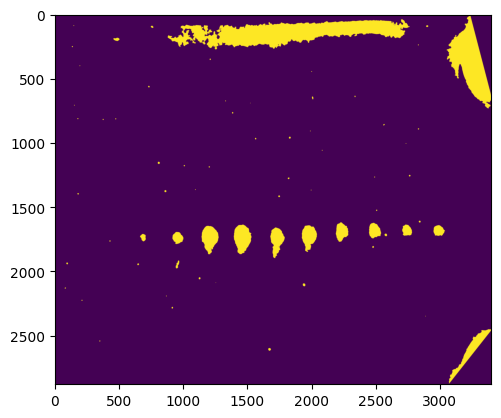

In [71]:
# Script that draws correct "polygon" with the incomplete "contours" 
from skimage import graph, draw

fun_mask = np.zeros(fun_img.shape, dtype=np.bool_)
for contour in found_contours:
    if (contour[0] != contour[-1]).all():
        R_max, C_max = fun_img.shape
        Rs, Re, Cs, Ce = contour[0][0], contour[-1][0], contour[0][1], contour[-1][1]
        start_pt = contour[0]
        end_pt = contour[-1]
        points = np.array([Rs, Re, Cs, Ce])
        CP = []
        if ((points[:2] == 0).any() and (points[:2] == R_max-1).any()) or ((points[2:] == 0).any() and (points[2:] == C_max-1).any()):
            closed_contour = None
        else:
            if (points[:2] == 0).any():
                CP.append(0)
            if (points[:2] == R_max-1).any():
                CP.append(R_max-1)
            if (points[2:] == 0).any():
                CP.append(0)
            if (points[2:] == C_max-1).any():
                CP.append(C_max-1)
            print (CP)
        closed_contour=np.vstack([contour, CP])
    else:
        closed_contour = contour

    rows, cols = draw.polygon(closed_contour[:, 0], closed_contour[:, 1])
    fun_mask[rows, cols] = True


#helpers.showRoiBoundary(fun_img, fun_mask)
plt.imshow(fun_mask)
plt.show()

fun_mask = np.zeros(fun_img.shape, dtype=np.bool_)
for contour in found_contours:
    rows, cols = draw.polygon(contour[:, 0], contour[:, 1])
    fun_mask[rows, cols] = True
#helpers.showRoiBoundary(fun_img, fun_mask)
plt.imshow(fun_mask)
plt.show()

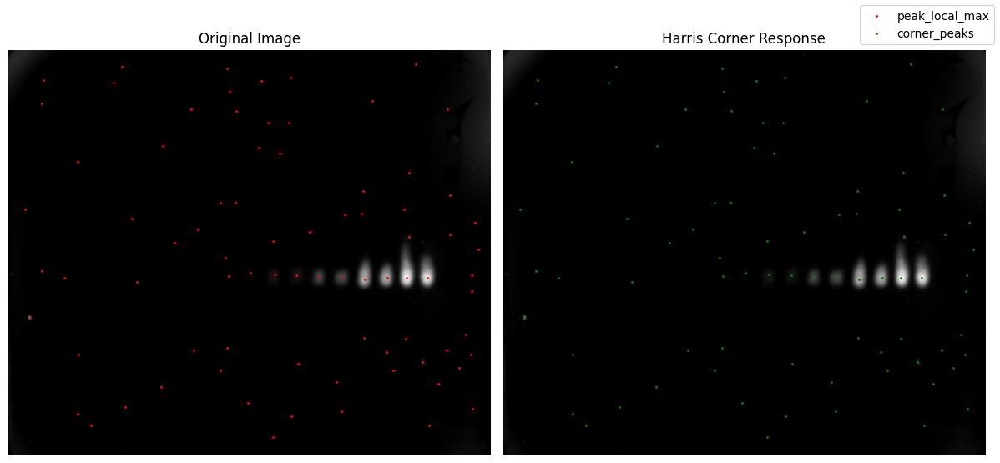

In [4]:
# Comparing "corner_peaks" vs "peak_local_max": They work the same in our case
import numpy as np
fname = "C:\\Users\\Chetan Hire\\OneDrive - proteowise.com\\Documents\\ProteoWise\\Python\\Signal\\signal.tif"

fun_img = process_images.process_images(fname)
harris_response = feature.corner_harris(fun_img, method='k', k=0.04, sigma=1)
harris_response_normalized = (harris_response - np.min(harris_response)) / (np.max(harris_response) - np.min(harris_response))
corners = feature.corner_peaks(fun_img, min_distance=80, num_peaks=80)
corners2 = feature.peak_local_max(fun_img, min_distance=80, num_peaks=80)

# Plot the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(fun_img, cmap='gray')
axes[0].scatter(corners2[:, 1], corners2[:, 0], color='red', s=1, label='peak_local_max')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(fun_img, cmap='gray')
axes[1].scatter(corners[:, 1], corners[:, 0], color='green', s=1, label='corner_peaks')
axes[1].set_title('Harris Corner Response')
axes[1].axis('off')

fig.legend()
fig.tight_layout()
fig.show()
